# Analysis of the AirBnB listings in New York City

In this notebook we will analyse the listings on the AirBnB website in New York City. We will focus in particular on:

• Analyzing the data quantitatively per neighborhood, borough, amenities, etc, showing how many listings are in each of category and also the average price

• Remove the columns in the dataframe that are not useful for our study (e.g. the listing url)

• Cleaning the data if needed, removing NaNs

• Studying the correlation between the different features and the price of the listing

• Add a column for each amenity, indicating with a boolean variable whether a specific listing has that amenity (1) or not (0)

• Analyzing the description of the listings, highlighting the relationships between specific keywords and the price/neighboorhood/size of the listing. One example is the word "cozy": what are the average size and price when such word appears in the description? Same goes for the word "luxurious"/"luxury"

• Plot some interesting findings

• In another notbook, we will use some machine learning models to estimate the price of a listing given its features (location, neighboorhood, amenities, size, etc)

## Importing and cleaning the data

### Import the data and remove unuseful columns

In [55]:
#Import the useful stuff
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

import numpy as np
from scipy import optimize
from datetime import datetime, date, timedelta
from scipy.stats.mstats import gmean
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import MinMaxScaler

import folium
import fnmatch
import re
import copy
from collections import Counter
import nltk.corpus
from wordcloud import WordCloud, STOPWORDS
from nltk.corpus import stopwords
from os import path
from PIL import Image

In [2]:
#Useful configurations
pd.set_option("display.max_rows", 100, "display.max_columns", None)

In [3]:
#Read the dataframe and use ID column as index
df = pd.read_csv('listings_nyc.csv', index_col='id')
df.index.name = None

In [4]:
#Which are the columns in the dataframe?
df.columns

Index(['listing_url', 'scrape_id', 'last_scraped', 'name', 'description',
       'neighborhood_overview', 'picture_url', 'host_id', 'host_url',
       'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_updated',

Let's remove the columns we don't need

In [5]:
df.drop(['scrape_id', 'last_scraped','picture_url','host_url','host_thumbnail_url', 
         'host_picture_url','host_verifications','host_has_profile_pic', 'host_identity_verified',  
         'neighbourhood','calendar_updated','last_review','has_availability','calendar_last_scraped', 
         'instant_bookable','calculated_host_listings_count','calculated_host_listings_count_entire_homes', 
         'calculated_host_listings_count_private_rooms','calculated_host_listings_count_shared_rooms',
         'neighborhood_overview','license','availability_30', 'availability_60', 'availability_90', 'minimum_nights',
         'maximum_nights','minimum_minimum_nights','maximum_minimum_nights', 'minimum_maximum_nights',
         'maximum_maximum_nights','minimum_nights_avg_ntm','maximum_nights_avg_ntm','availability_365',
         'host_name','host_about','host_response_time','host_response_rate','host_acceptance_rate'],inplace = True, axis = 1)

We have eliminated the column 'neighbourhood' because 'neighbourhood_cleansed' is the column that contains the actual neighborhood in the correct format.

Let's now take a look at the dataframe

In [6]:
df.head(5)

,listing_url,name,description,host_id,host_since,host_location,host_is_superhost,host_neighbourhood,host_listings_count,host_total_listings_count,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month
2595,https://www.airbnb.com/rooms/2595,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",2845,2008-09-09,"New York, New York, United States",f,Midtown,6.0,6.0,Midtown,Manhattan,40.75356,-73.98559,Entire apartment,Entire home/apt,2,NaN,1 bath,NaN,1.0,"[""Refrigerator"", ""Essentials"", ""Cleaning befor...",$150.00,48,0,0,2009-11-21,94.0,9.0,9.0,10.0,10.0,10.0,9.0,0.35
3831,https://www.airbnb.com/rooms/3831,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",4869,2008-12-07,"New York, New York, United States",f,Clinton Hill,1.0,1.0,Bedford-Stuyvesant,Brooklyn,40.68494,-73.95765,Entire guest suite,Entire home/apt,3,NaN,1 bath,1.0,3.0,"[""Bathtub"", ""Smoke alarm"", ""Dishes and silverw...",$76.00,396,80,2,2014-09-30,89.0,10.0,9.0,9.0,10.0,10.0,10.0,4.98
5121,https://www.airbnb.com/rooms/5121,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,7356,2009-02-03,"New York, New York, United States",f,Bedford-Stuyvesant,1.0,1.0,Bedford-Stuyvesant,Brooklyn,40.68535,-73.95512,Private room in apartment,Private room,2,NaN,NaN,1.0,1.0,"[""Kitchen"", ""Heating"", ""Wifi"", ""Long term stay...",$60.00,50,0,0,2009-05-28,90.0,8.0,8.0,10.0,10.0,9.0,9.0,0.35
5136,https://www.airbnb.com/rooms/5136,"Spacious Brooklyn Duplex, Patio + Garden",We welcome you to stay in our lovely 2 br dupl...,7378,2009-02-03,"New York, New York, United States",f,Greenwood Heights,1.0,1.0,Sunset Park,Brooklyn,40.66265,-73.99454,Entire apartment,Entire home/apt,4,NaN,1.5 baths,2.0,2.0,"[""Kitchen"", ""Cable TV"", ""TV"", ""Carbon monoxide...",$175.00,1,0,0,2014-01-02,97.0,10.0,10.0,10.0,10.0,8.0,10.0,0.01
5178,https://www.airbnb.com/rooms/5178,Large Furnished Room Near B'way,Please don’t expect the luxury here just a bas...,8967,2009-03-03,"New York, New York, United States",f,Hell's Kitchen,1.0,1.0,Midtown,Manhattan,40.76457,-73.98317,Private room in apartment,Private room,2,NaN,1 bath,1.0,1.0,"[""Heating"", ""Bed linens"", ""TV"", ""Iron"", ""Free ...",$79.00,474,1,0,2009-05-06,84.0,9.0,8.0,9.0,9.0,10.0,9.0,3.26


In [7]:
df.describe(include='all')

,listing_url,name,description,host_id,host_since,host_location,host_is_superhost,host_neighbourhood,host_listings_count,host_total_listings_count,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month
count,36905,36892,35637,3.690500e+04,35637,35549,35637,29280,35637.000000,35637.000000,36905,36905,36905.000000,36905.000000,36905,36905,36905.000000,0.0,36791,33231.000000,36326.000000,36905,36905,36905.000000,36905.000000,36905.000000,27185,26496.000000,26471.000000,26482.000000,26461.000000,26474.000000,26460.000000,26460.000000,27185.000000
unique,36905,35651,33507,NaN,4035,1393,2,415,NaN,NaN,220,5,NaN,NaN,77,4,NaN,NaN,36,NaN,NaN,31447,777,NaN,NaN,NaN,3318,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,https://www.airbnb.com/rooms/22037644,Well-kept apartment home | 1BR in New York,Stay for 31+ nights (minimum nights and rates ...,NaN,2016-12-16,"New York, New York, United States",f,Williamsburg,NaN,NaN,Bedford-Stuyvesant,Manhattan,NaN,NaN,Entire apartment,Entire home/apt,NaN,NaN,1 bath,NaN,NaN,"[""Long term stays allowed""]",$150.00,NaN,NaN,NaN,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,41,55,NaN,278,22099,29301,2114,NaN,NaN,2713,16294,NaN,NaN,15329,19243,NaN,NaN,19005,NaN,NaN,138,1298,NaN,NaN,NaN,94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,9.847262e+07,NaN,NaN,NaN,NaN,28.464293,28.464293,NaN,NaN,40.729395,-73.950308,NaN,NaN,2.791898,NaN,NaN,1.318137,1.535126,NaN,NaN,22.668636,2.609104,0.270370,NaN,93.699200,9.578520,9.268144,9.713503,9.706089,9.594747,9.364928,0.854783
std,NaN,NaN,NaN,1.145377e+08,NaN,NaN,NaN,NaN,181.069747,181.069747,NaN,NaN,0.054947,0.048829,NaN,NaN,1.861854,NaN,NaN,0.716233,1.137882,NaN,NaN,48.003378,10.938558,1.216445,NaN,9.855021,0.961176,1.158340,0.843701,0.871186,0.810880,1.029778,1.349439
min,NaN,NaN,NaN,2.438000e+03,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,40.508630,-74.241350,NaN,NaN,0.000000,NaN,NaN,1.000000,0.000000,NaN,NaN,0.000000,0.000000,0.000000,NaN,20.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,0.010000
25%,NaN,NaN,NaN,1.010236e+07,NaN,NaN,NaN,NaN,1.000000,1.000000,NaN,NaN,40.690080,-73.983510,NaN,NaN,2.000000,NaN,NaN,1.000000,1.000000,NaN,NaN,0.000000,0.000000,0.000000,NaN,92.000000,9.000000,9.000000,10.000000,10.000000,9.000000,9.000000,0.100000
50%,NaN,NaN,NaN,4.267652e+07,NaN,NaN,NaN,NaN,1.000000,1.000000,NaN,NaN,40.725300,-73.955280,NaN,NaN,2.000000,NaN,NaN,1.000000,1.000000,NaN,NaN,4.000000,0.000000,0.000000,NaN,97.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,0.340000
75%,NaN,NaN,NaN,1.613001e+08,NaN,NaN,NaN,NaN,3.000000,3.000000,NaN,NaN,40.762320,-73.932450,NaN,NaN,4.000000,NaN,NaN,1.000000,2.000000,NaN,NaN,20.000000,1.000000,0.000000,NaN,100.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,1.090000


### Clean the data

#### Replacing missing data and changing the data types

The columns 'bathroom' and 'bedrooms' seem to have a lot of NaNs. Let's confirm this:

In [8]:
print(np.count_nonzero(np.isnan(df['bathrooms']))/len(df.bathrooms)*100)
print(np.count_nonzero(np.isnan(df['bedrooms']))/len(df.bathrooms)*100)

100.0
9.955290611028316


100% of the column 'bathrooms' contains a NaN. However, the column 'bathrooms_text' contains the correct values for the bathrooms.

Note that a 'half bathroom' means usually a toilet + sink

In [9]:
print(df.bathrooms_text.unique())

['1 bath' nan '1.5 baths' '1 shared bath' '1 private bath' '2 baths'
 '1.5 shared baths' '3 baths' 'Half-bath' '2 shared baths' '2.5 baths'
 '5 baths' '0 baths' '0 shared baths' 'Private half-bath'
 'Shared half-bath' '4.5 baths' '5.5 baths' '2.5 shared baths' '3.5 baths'
 '15.5 baths' '6 baths' '4 baths' '3 shared baths' '4 shared baths'
 '3.5 shared baths' '6 shared baths' '6.5 shared baths' '4.5 shared baths'
 '7.5 baths' '5.5 shared baths' '5 shared baths' '6.5 baths' '8 baths'
 '7 baths' '7 shared baths' '9.5 baths']


The listings with 0 baths do have one, but the hosts have not indicated it correctly on the listing. Let's correct it. Let's do the same for the NaN baths.

Let's also change extract the number from 'bathrooms_text' and add it to 'bathrooms', then drop 'bathrooms_text'. We will obtain a column with the numeric value of the number of bathrooms


In [10]:
df.loc[df.bathrooms_text.isna(),'bathrooms_text'] = '1'
for string in ['0 baths','0 shared baths','0 shared baths','Shared half-bath','Private half-bath','Half-bath']:
    df.loc[df.bathrooms_text == string,'bathrooms_text'] = '1'

df.loc[:,'bathrooms'] = [float(s.split()[0]) for s in df.loc[:,'bathrooms_text']]

df.drop('bathrooms_text',axis = 1,inplace = True)

Let's check the data types. Does the data type match the column values?

In [11]:
print(df.dtypes)

listing_url                      object
name                             object
description                      object
host_id                           int64
host_since                       object
host_location                    object
host_is_superhost                object
host_neighbourhood               object
host_listings_count             float64
host_total_listings_count       float64
neighbourhood_cleansed           object
neighbourhood_group_cleansed     object
latitude                        float64
longitude                       float64
property_type                    object
room_type                        object
accommodates                      int64
bathrooms                       float64
bedrooms                        float64
beds                            float64
amenities                        object
price                            object
number_of_reviews                 int64
number_of_reviews_ltm             int64
number_of_reviews_l30d            int64


We notice that 'host_since' and 'first_review' are 'object', but they should be dates. Moreover, beds is float64 and it should be int64. Let's correct that

In [12]:
for col in ['host_since','first_review']:
    df.loc[:,col] = pd.to_datetime(df.loc[:,col])

The column 'host_is_superhost' has values 'f' or 't'. Let's change it to '0' or '1'

In [13]:
df.loc[df['host_is_superhost'] == 't','host_is_superhost'] = 1
df.loc[df['host_is_superhost'] == 'f','host_is_superhost'] = 0    

The price is in 'object' format. Let's change it to a float

In [14]:
df.price = df.price.str.replace('$','').str.replace(',','')
df.loc[:,'price'] = pd.to_numeric(df.price)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  """Entry point for launching an IPython kernel.


Let's now check how many missing values are in each column and let's deal with them. For each column, we will choose a different solution. For some of them we will replace the missing values with the minimum, for other ones with the average.

Let's start then by seeing the percentage of null values for each column.

In [15]:
df.isnull().sum().sort_values(ascending = False)/len(df.index)*100

review_scores_location          28.302398
review_scores_value             28.302398
review_scores_checkin           28.299688
review_scores_accuracy          28.272592
review_scores_communication     28.264463
review_scores_cleanliness       28.242786
review_scores_rating            28.204850
first_review                    26.337895
reviews_per_month               26.337895
host_neighbourhood              20.661157
bedrooms                         9.955291
host_location                    3.674299
host_total_listings_count        3.435849
host_listings_count              3.435849
host_is_superhost                3.435849
host_since                       3.435849
description                      3.435849
beds                             1.568893
name                             0.035226
number_of_reviews                0.000000
number_of_reviews_l30d           0.000000
number_of_reviews_ltm            0.000000
listing_url                      0.000000
price                            0

We notice that many columns are missing some values. Let's fix this:

• For most of the numerical columns, we will replace the quantity with the average of that column. This applies to all the "review" columns, to

• For the columns that contain dates, we will also apply the mean. This applies to columns "first_review" and "host_since"

• For the "host_is_superhost" column, we will apply a value of 0

• We assign to the empty values in the "bedrooms" column a value of 1, since there is at least 1 bedroom, and using the mean could lead to large errors. Another possibility is to drop the rows for which there is no data of the amount of bedrooms, but that would mean losing around 10% of the listings.

• For the "description" column, we will add a "No description" value. For the "name" column we adopt the same strategy and enter the value "No name"

• For the "host_neighbourhood" column, we will take the neighborhood of the listing

In [16]:
mean_cols = ['review_scores_value', 'review_scores_location', 'review_scores_checkin', 'review_scores_accuracy',
               'review_scores_communication', 'review_scores_cleanliness', 'review_scores_rating','reviews_per_month',
            'beds']
int_cols = ['beds']

for col in mean_cols:
    if col not in int_cols:
        df.loc[:,col].fillna(df.loc[:,col].mean(),inplace = True)
    else:
        df.loc[:,col].fillna(df.loc[:,col].mean().astype('int'),inplace = True)

df['bedrooms'].fillna(1,inplace = True)
df['host_is_superhost'].fillna(0,inplace = True)
df['description'].fillna('No description',inplace = True)
df['name'].fillna('No name',inplace = True)
df['first_review'].fillna(df.first_review.mean(),inplace = True)
#host columns
df['host_neighbourhood'].fillna(df.neighbourhood_cleansed,inplace = True)
df['host_location'].fillna(df.host_location.describe().top,inplace = True)
df['host_since'].fillna(df.host_since.mean(),inplace = True)
df['host_since'].fillna(df.host_since.mean(),inplace = True)
df['host_listings_count'].fillna(int(df.host_listings_count.mean()),inplace = True)
df['host_total_listings_count'].fillna(int(df.host_total_listings_count.mean()),inplace = True)


In [17]:
df.beds = df.beds.astype('int')

#### Removing elements with wrong data

Since one of our main focus is the price of the listing, let's check the statistical properties of the price column

In [232]:
df['price'].describe()

count    36638.000000
mean       132.482395
std        119.080104
min          0.000000
25%         60.000000
50%        100.000000
75%        158.000000
max       1000.000000
Name: price, dtype: float64

We notice that at least one listing has a null price. Let's check for how many listings this is true

In [234]:
np.shape(df[df['price']==0])

(35, 374)

So it appears that only 35 listings have no price. Since this number is quite low, let us drop them

In [239]:
df.drop(df[df['price']==0].index,inplace= True)

#### Removal of outliers

Let's now plot a boxplot for the 5 boroughs of NYC and their price. From the boxplots we will learn more about the distribution of the price in each borough and also we will spot the outliers

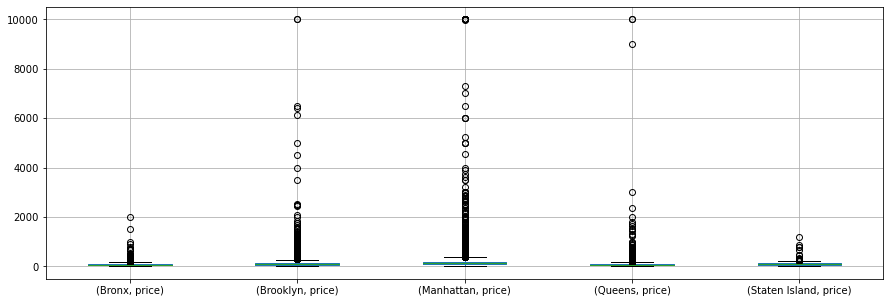

In [18]:
boroughs_prices = df.groupby('neighbourhood_group_cleansed')
boroughs_prices.boxplot(column = 'price', subplots = False, figsize = (15,5))
plt.show()

We notice that there is a very large amount of outliers. Let's see the plot again but limiting the y-axis to 1000$.

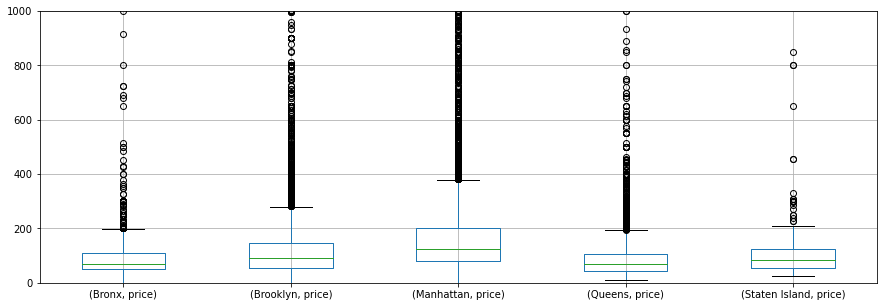

In [19]:
boroughs_prices = df.groupby('neighbourhood_group_cleansed')
boroughs_prices.boxplot(column = 'price', subplots = False, figsize = (15,5))
plt.ylim(0,1000)
plt.show()

We notice that indeed limiting the prices up to 1000\\$ seems a good choice, although there are still many outliers above 200$. Let's drop all the listings with a price higher than 1000\\$.

In [20]:
df.drop(index = df[df.price > 1000].index, inplace = True)

#### Amenities of the listings

Let's create a different column for each amenity, with a boolean value indicating whether that amenity is present or not.
First, let's start by creating a set of all the amenities

In [21]:
df.loc[:,'amenities'] = df.loc[:,'amenities'].str.lower()
df['amenities'] = df['amenities'].str.replace(
    '$','').str.replace('cable tv','tv')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  This is separate from the ipykernel package so we can avoid doing imports until


In [22]:
amenities = set()
for idx in df.index:
    df.loc[idx,'amenities'] = re.sub('\\\\','',df.loc[idx,'amenities'])
    string_list = [each_string.lower() for each_string in (df.loc[idx,'amenities'].split('"'))]
    #string_list = df.loc[idx,'amenities'].replace('[','').replace(']','').replace('"','').split(', ')
    amenities = amenities.union(set(string_list))
    
amenities.difference_update(set([', ','[',']','[]']))
amenities

{' bosh refrigerator',
 ' hdtv',
 ' hdtv with amazon prime video',
 ' hdtv with amazon prime video, apple tv, chromecast, hbo max, netflix, premium cable, roku',
 ' hdtv with amazon prime video, apple tv, chromecast, hbo max, netflix, roku, premium cable',
 ' hdtv with amazon prime video, apple tv, hbo max, chromecast, netflix, premium cable, roku',
 ' hdtv with amazon prime video, apple tv, hbo max, netflix, premium cable',
 ' hdtv with amazon prime video, apple tv, hbo max, netflix, premium cable, roku, standard cable',
 ' hdtv with amazon prime video, apple tv, hbo max, netflix, premium cable, standard cable',
 ' hdtv with amazon prime video, apple tv, hbo max, netflix, roku',
 ' hdtv with amazon prime video, apple tv, netflix',
 ' hdtv with amazon prime video, apple tv, netflix, hbo max',
 ' hdtv with amazon prime video, chromecast',
 ' hdtv with amazon prime video, chromecast, apple tv, hbo max, netflix, premium cable, roku',
 ' hdtv with amazon prime video, chromecast, netflix, s

From the list of amenities, we see that many are very similar between them and we can group them together, e.g. ' HDTV','HDTV with Amazon Prime Video' means there is a TV. Same for shampoo, etc.

Let's create a sorted dictionary of the words inside the amenities with their frequency and then group together these amenities with a single word.


In [23]:
am_list = list(amenities)
words = []
for am in am_list:
    words.extend(am.split())

#Create a dictionary with all the words in the amenities and sort by most frequent
{k: v for k, v in sorted(Counter(words).items(), key=lambda item: item[1],reverse= True)}

{'with': 170,
 'and': 107,
 'hdtv': 103,
 'soap': 97,
 'body': 93,
 'amazon': 86,
 'prime': 85,
 'netflix,': 83,
 'sound': 75,
 'system': 74,
 'conditioner': 69,
 'video,': 62,
 'stainless': 57,
 'steel': 57,
 'stove': 57,
 'bluetooth': 55,
 'shampoo': 53,
 'refrigerator': 52,
 'u2014': 51,
 'u2013': 46,
 'oven': 45,
 'tv': 44,
 'hbo': 42,
 'parking': 42,
 'cable': 41,
 'premium': 40,
 'max,': 34,
 'standard': 34,
 'clothing': 33,
 'paid': 33,
 'premises': 33,
 'dedicated': 32,
 'storage:': 31,
 'cable,': 31,
 'workspace:': 31,
 'apple': 31,
 'onsite': 29,
 'gas': 28,
 'wifi': 28,
 'aux': 28,
 'roku': 26,
 'tv,': 25,
 'per': 24,
 'office': 24,
 'mbps': 23,
 'video': 23,
 'on': 23,
 'restaurant': 22,
 'netflix': 22,
 'bar': 21,
 'closet': 20,
 '&': 20,
 'closet,': 20,
 'electric': 18,
 'in': 18,
 'roku,': 17,
 'walk-in': 16,
 'desk': 16,
 'toiletries': 15,
 'chromecast': 15,
 'chromecast,': 15,
 'garage': 15,
 'day': 14,
 'years': 14,
 'game': 14,
 'table': 14,
 'off': 14,
 'table,': 13

We can use the above frequency list to understand which are the amenities that we can group together with a single word:

In [24]:
df.loc[:,'amenities'].iloc[0]

'["refrigerator", "essentials", "cleaning before checkout", "long term stays allowed", "luggage dropoff allowed", "baking sheet", "dishes and silverware", "kitchen", "keypad", "tv", "heating", "fire extinguisher", "paid parking off premises", "free street parking", "cooking basics", "bathtub", "stove", "ethernet connection", "hot water", "wifi", "hair dryer", "dedicated workspace", "iron", "extra pillows and blankets", "coffee maker", "carbon monoxide alarm", "hangers", "smoke alarm", "oven", "bed linens", "air conditioning"]'

In [25]:
remove_and_add_str = ['tv', 'shampoo','refrigerator','wifi','soap','gym', 'clothing storage',
                      'oven','stove','sound system','breakfast','toiletries','parking','coffee maker','game console',
                      'dedicated workspace','air conditioning','pool','garden','hot tub', 'washer', 'heating','linens',
                     'pillows','books and toys','dryer','onsite restaurant','onsite bar', 'onsite rooftop']
#remove_only.extend(remove_and_add_str)
tmp = copy.deepcopy(amenities)

for am in tmp:
    for rem in remove_and_add_str:
        if rem in am:
            amenities.discard(am)
            df.loc[:,'amenities'] = df.loc[:,'amenities'].str.replace(am,rem)
                

amenities = amenities.union(set(remove_and_add_str))
print('There are ' + str(len(amenities)) + ' amenities')


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: FutureWarning: The default value of regex will change from True to False in a future version.
  if sys.path[0] == '':


There are 236 amenities


In [26]:
amenities

{' there is a celling fan an a portable ac in the bedroom conditioner',
 '100',
 '12',
 '120',
 '20',
 '24',
 '24-hour fitness center',
 '26',
 '30',
 '32',
 '36',
 '37',
 '39',
 '40',
 '42',
 '43',
 '45',
 '46',
 '47',
 '48',
 '49',
 '50',
 '51',
 '52',
 '54',
 '55',
 '58',
 '60',
 '62',
 '64',
 '65',
 '72',
 '75',
 '84',
 '85',
 'air conditioning',
 'airport shuttle',
 'all inclusive',
 'amika conditioner',
 'asprey from the ritz carlton conditioner',
 'aussie  conditioner',
 'baby bath',
 'baby monitor',
 'baby safety gates',
 'babysitter recommendations',
 'backyard',
 'baking sheet',
 'barbecue utensils',
 'bath & body works conditioner',
 'bathrobes',
 'bathtub',
 'bbq grill',
 'beach essentials',
 'beachfront',
 'bergman kelly conditioner',
 'bidet',
 'bikes',
 'bluetooth speaker',
 'board games',
 'boat slip',
 'books and toys',
 'bottled water',
 'brands vary. conditioner',
 'bread maker',
 'breakfast',
 'building staff',
 'carbon monoxide alarm',
 'ceiling fan',
 'central con

In [27]:
#Add one column for each amenity
for am in amenities:
    df[am] = 0

In [28]:
#Assign a value of 1 to each column if the listing has that amenity
for idx,row in enumerate(df.index):
    tmp = df.loc[row,'amenities'].split('"')
    
    try:
        del tmp[0]
        del tmp[-1]
        del tmp[1::2]

        tmp = set(tmp)
        list(tmp)    
        df.loc[row,tmp] = 1
    except:
        continue

Let's keep only the amenities that appear at least in 10% of the listings 

In [29]:
temp = df.loc[:,amenities].sum()
temp = temp.sort_values(ascending = False)
to_drop = temp[temp/len(df.index) < 0.1]
temp = temp[temp/len(df.index) >= 0.1]
#drop the columns that do not appear often
df.drop(columns=to_drop.keys(),inplace=True) 
df.drop(columns =  df.columns[df.isna().sum()> 0.90*len(df.index)],inplace = True)
amenities_kept = temp #useful for later

Which are the most frequent amenities?

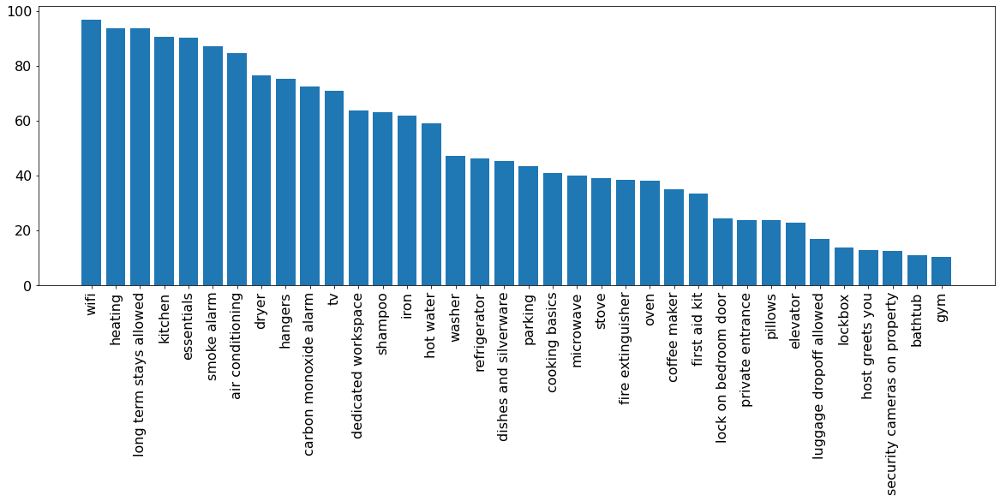

In [287]:
plt.bar(list(temp.keys()),temp/len(df.index)*100)
plt.rcParams['figure.figsize']=(20,6)
plt.tick_params(labelsize=16)
plt.xticks(rotation='vertical')
plt.show()

## Bar plots

In [40]:
def groupby_amount_mean_price(df, group):
    ### Returns a dataframe the 'group' as index and two columns indicating the total listings and average price
    ### for each of the groups in the index
    df_out = df.loc[:,[group,'description','price']]\
                .groupby([group]).agg({'description':['count'],'price':'mean'})
    df_out['listings_count'] = df_out['description']['count']
    df_out['mean_price'] = df_out['price']['mean']
    df_out.drop(axis=1,columns=['description','price'],inplace = True)
    
    return df_out

def plot_bar_amount_mean_price(df,n_plot, figsize = (16,5), title_amount = ' ', title_price = ' '):
    ### Plots a bar chart for both the amount of listings and average price, where each bar is a category of group
    plt.bar(df.nlargest(n_plot,'listings_count').index,
        df.nlargest(n_plot,'listings_count')['listings_count'].values)
    plt.rcParams['figure.figsize'] = figsize
    plt.xticks(rotation='vertical')
    plt.grid()
    plt.title(title_amount)
    plt.show()
    
    plt.bar(df.nlargest(n_plot,'mean_price').index,
        df.nlargest(n_plot,'mean_price')['mean_price'].values)
    plt.rcParams['figure.figsize'] = figsize
    plt.xticks(rotation='vertical')
    plt.grid()
    plt.title(title_price)
    plt.show()

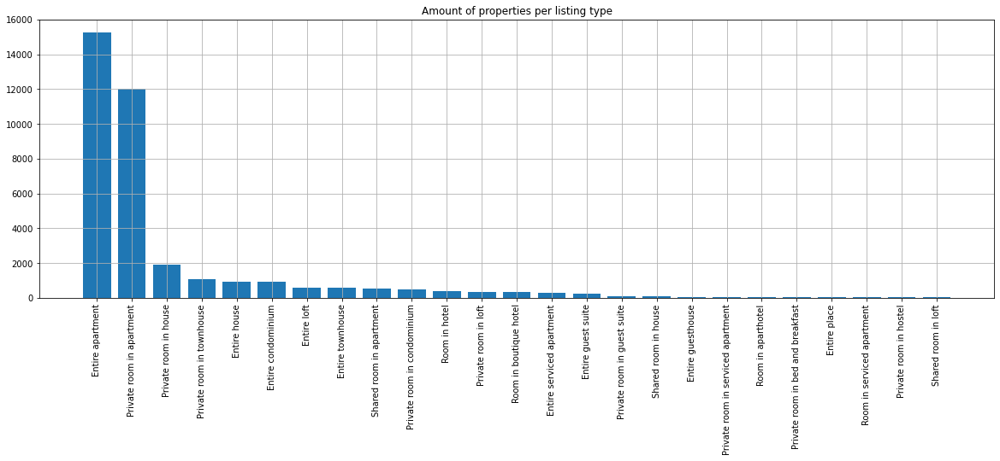

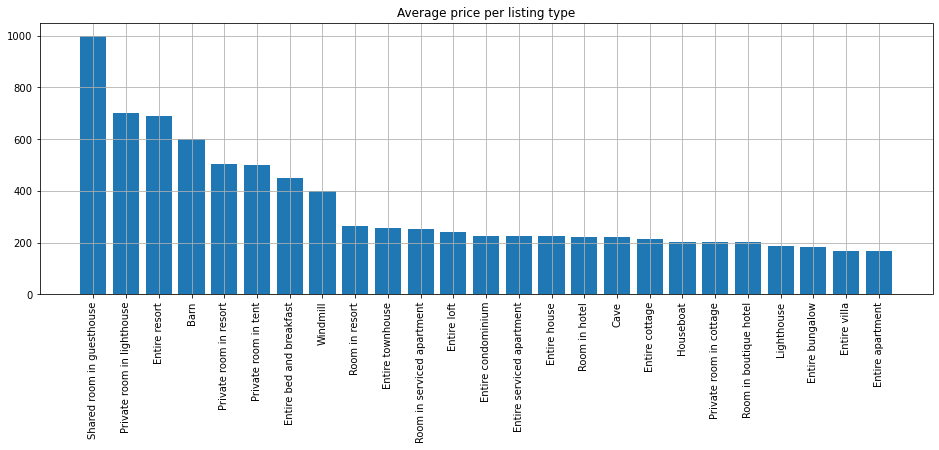

In [288]:
n_plot = 25
df_properties = groupby_amount_mean_price(df,'property_type')
plot_bar_amount_mean_price(df_properties,n_plot, title_amount = 'Amount of properties per listing type',
                          title_price = 'Average price per listing type')

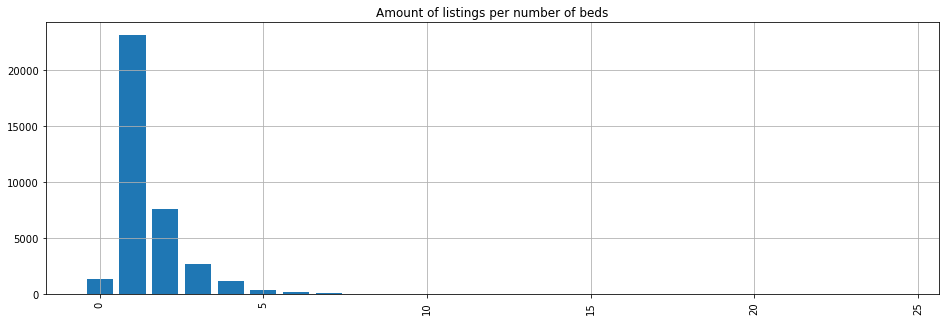

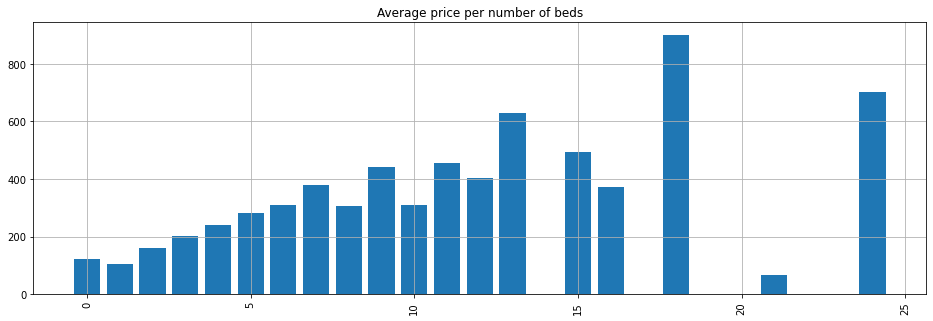

In [33]:
n_plot = 25
df_beds = groupby_amount_mean_price(df,'beds')
plot_bar_amount_mean_price(df_beds,n_plot, title_amount = 'Amount of listings per number of beds',
                          title_price = 'Average price per number of beds')

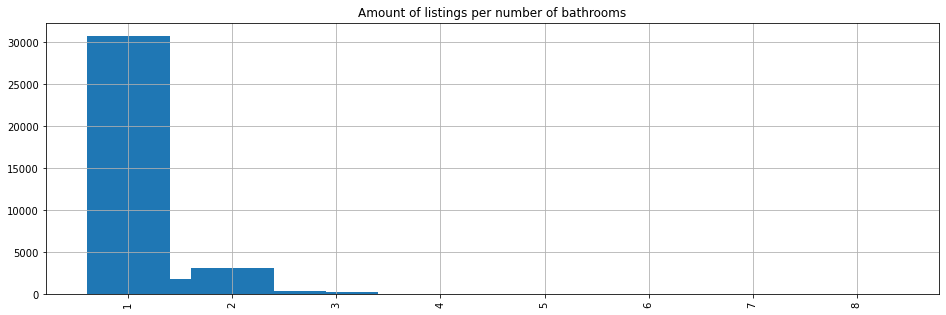

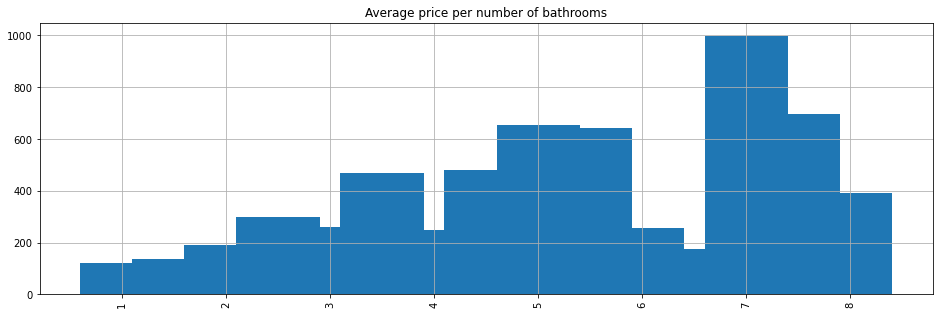

In [34]:
n_plot = 25
df_beds = groupby_amount_mean_price(df,'bathrooms')
plot_bar_amount_mean_price(df_beds,n_plot, title_amount = 'Amount of listings per number of bathrooms',
                          title_price = 'Average price per number of bathrooms')

## Breaking up the description of the listings and plotting wordclouds

Now we will extract the information from the descriptions of the listings and see if there is any relationship between the most used words in the description and the price/borough of the listing.

First of all, let's remove some unwanted characters in the description.

In [35]:
df.description = df.description.str.replace('<br />', ' ').str.replace('</b>', ' ').str.replace('<b>', ' ')

In [36]:
stopwords_en = set(STOPWORDS)
from nltk.corpus import stopwords
import nltk
nltk.download("stopwords")
stop_words = stopwords.words('english')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Tomas\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Add the following words to the stopwords, which are not really interesting for the wordcloud. We want to focus on the amenities/desciption of the listings per neighborhood, removing the word that are common to every (most of the) listing.

In [37]:
stop_words.extend(['bedroom','apartment','bedroom','room','bathroom','kitchen','space','access','building',
                  'bed','guest','one','located','living','full','new','private','walk','park','city','home','floor',
                  'York','NYC'])

In [38]:
#merge the descriptions, using lower case to avoid counting differently e.g. 'WiFi' and 'wifi'
descriptions = ''.join(df["description"]).lower()

### Plotting wordclouds

In [43]:
def generate_word_cloud(stop_words,text, mask = None, contour_width = 1):
    # instantiate a word cloud object
    wc = WordCloud(
    background_color='white',
    max_words=2000,
    stopwords = stop_words,
    normalize_plurals=False,
    width=int(2.5*400),
    height=int(2.5*200),
    collocations=False,
    mask = mask,
    contour_width = contour_width
    )

    # generate the word cloud
    wc.generate_from_text(text)
    
    return wc

def plot_word_cloud(wordcloud, title = 'Wordcloud', size = (20,18)):
    fig = plt.figure()
    fig.set_figwidth(size[0]) # set width
    fig.set_figheight(size[0]) # set height

    # display the cloud
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title, fontsize=25)
    plt.show()

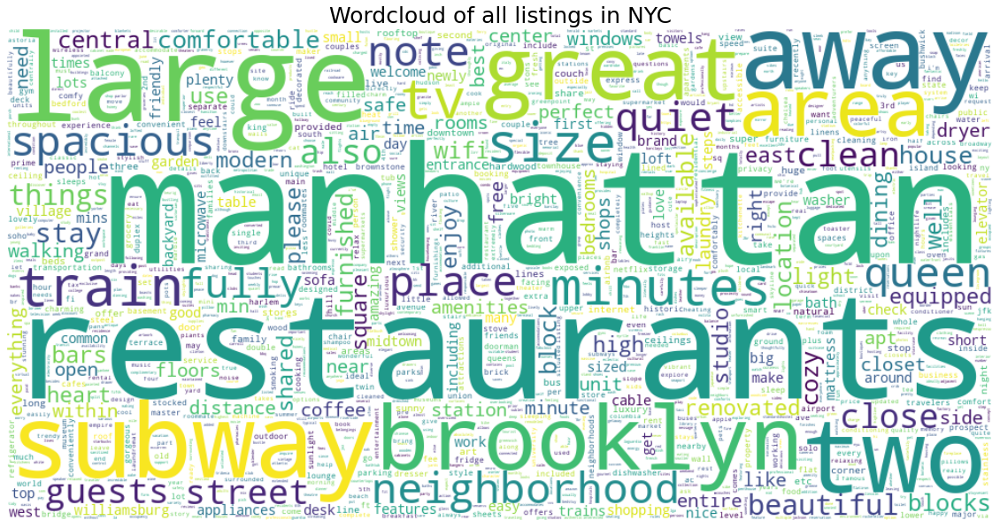

In [44]:
wc_airbnb_all = generate_word_cloud(stop_words,descriptions)
plot_word_cloud(wc_airbnb_all,'Wordcloud of all listings in NYC')


Let us now plot one wordcloud for each borough of NYC

In [45]:
bor_descr = df.loc[:,['description','neighbourhood_group_cleansed']].groupby('neighbourhood_group_cleansed')

In [46]:
boroughs = df.neighbourhood_group_cleansed.unique()
wc_bors = {}
for bor in boroughs:
    descriptions_bor = ''.join(bor_descr.get_group(bor).description).lower()
    wc_bors[bor] = generate_word_cloud(stop_words,descriptions_bor)    

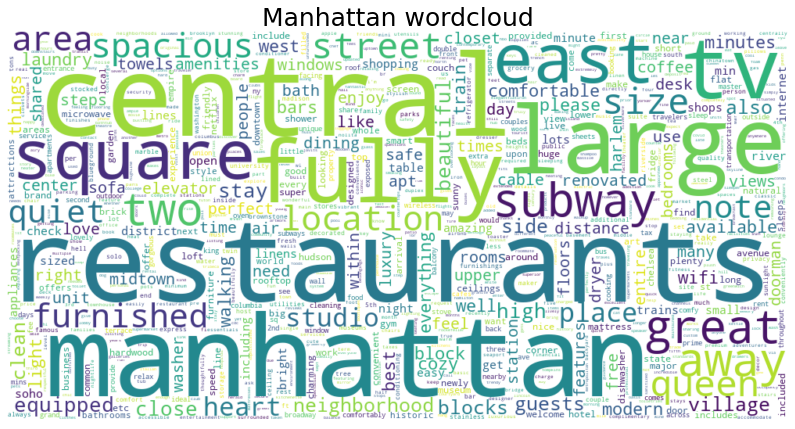

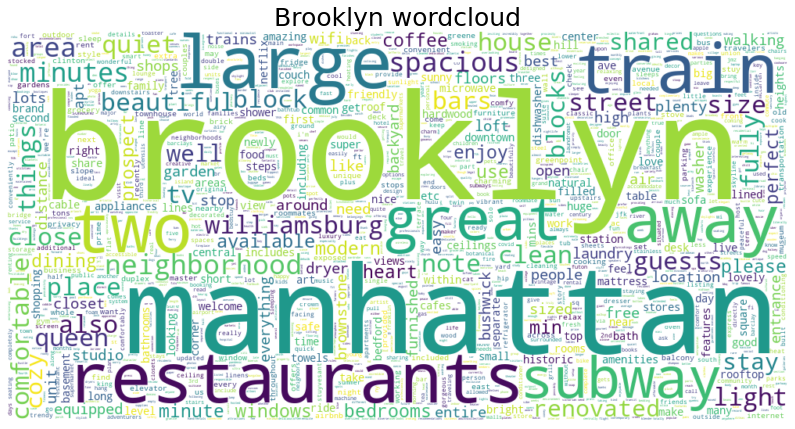

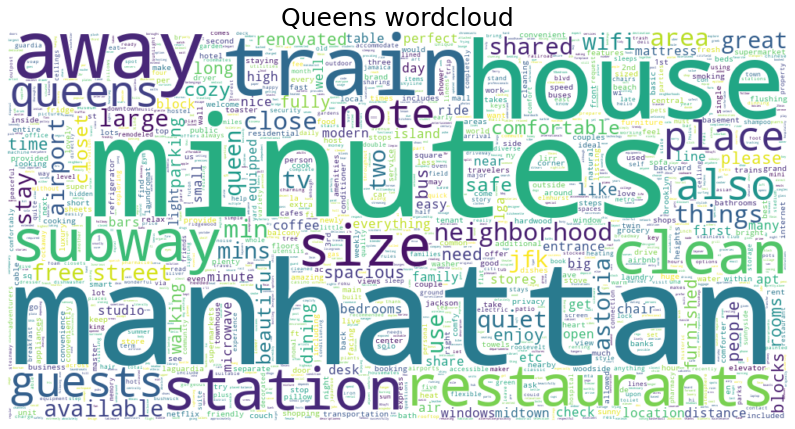

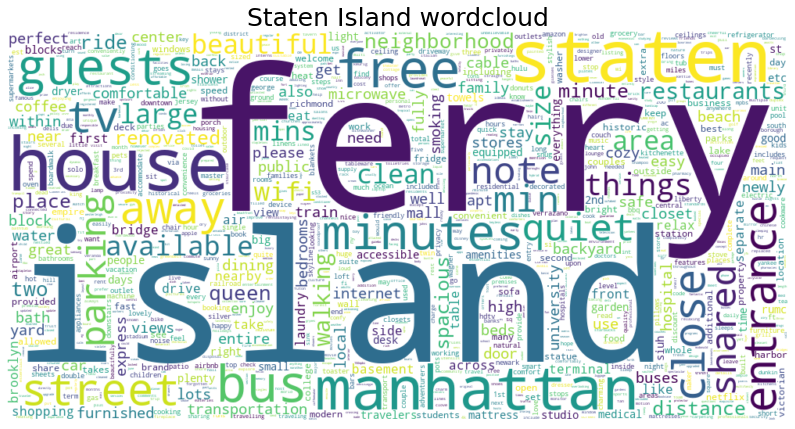

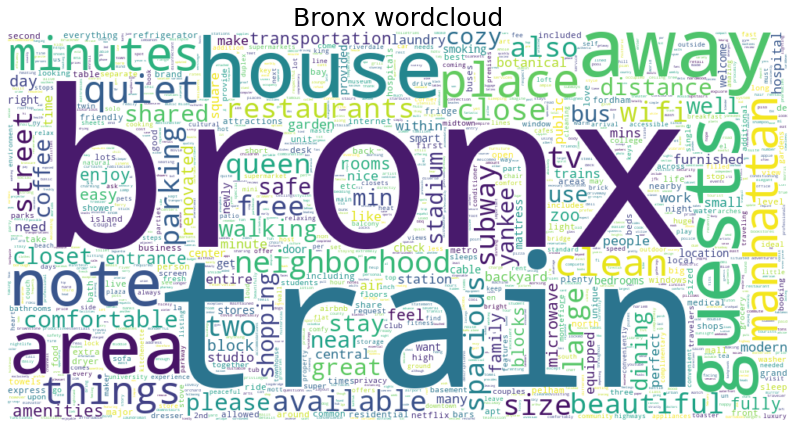

In [47]:
for bor in boroughs:
    plot_word_cloud(wc_bors[bor], bor + ' wordcloud', (14,6))

In [48]:
wc_bors['Manhattan'].words_

{'restaurants': 1.0,
 'central': 0.9624378567482968,
 'manhattan': 0.9438409132756398,
 'large': 0.92911066102007,
 'fully': 0.9125391272325538,
 'tv': 0.8976247468237893,
 'square': 0.8965199779046216,
 'east': 0.8869453139385012,
 'subway': 0.8758976247468238,
 'great': 0.8615356287976431,
 'away': 0.8477260173080464,
 'two': 0.8184496409501013,
 'queen': 0.8029828760817529,
 'size': 0.7788620880132572,
 'street': 0.7777573190940895,
 'area': 0.7238077702080649,
 'location': 0.7228871294420917,
 'spacious': 0.7076044927269379,
 'furnished': 0.7064997238077703,
 'quiet': 0.6976615724544283,
 'note': 0.6954520346160928,
 'place': 0.6908488307862272,
 'studio': 0.6529184312281348,
 'heart': 0.6518136623089671,
 'equipped': 0.6383723071257595,
 'high': 0.633769103295894,
 'stay': 0.6280611305468606,
 'beautiful': 0.6206960044190757,
 'close': 0.6159086724360154,
 'neighborhood': 0.6094641870742037,
 'guests': 0.6043085987847542,
 'also': 0.5884735776100166,
 'side': 0.5822132204013993,
 

In [49]:
words = ['cozy', 'luxurious', 'manhattan','attractions','ferry','safe','quiet']
for word in words:
    print('Word: ' + word)
    for bor in boroughs:
        try:
            print(bor,wc_bors[bor].words_[word])
        except:
            print('The word ' + word + ' is not used in the description for listings in ' + bor)
    avg_word_price = df[df.description.str.find(word) != -1].price.mean()
    print('Average price when this word appears in the description: ' + str(avg_word_price))
    print('\n')

Word: cozy
Manhattan 0.48002209537838336
Brooklyn 0.2687281795511222
Queens 0.3742810188989318
Staten Island 0.19140625
Bronx 0.3333333333333333
Average price when this word appears in the description: 116.76422250316055


Word: luxurious
Manhattan 0.09777204934634505
Brooklyn 0.01915211970074813
Queens 0.020542317173377157
Staten Island 0.01171875
Bronx 0.025193798449612403
Average price when this word appears in the description: 221.64310954063603


Word: manhattan
Manhattan 0.9438409132756398
Brooklyn 0.6608478802992519
Queens 1.0
Staten Island 0.734375
Bronx 0.5930232558139535
Average price when this word appears in the description: 115.26483050847457


Word: attractions
Manhattan 0.16148039035168477
Brooklyn 0.023042394014962594
Queens 0.029170090386195564
Staten Island 0.01953125
Bronx 0.13178294573643412
Average price when this word appears in the description: 156.8523316062176


Word: ferry
Manhattan 0.0149143804087645
Brooklyn 0.026134663341645884
Queens 0.02218570254724733
St

In [50]:
df[df.description.str.find('ferry') != -1].price.mean()

134.52805280528054

Finally, let's generate an artistic wordcloud using the skyline silhouette of Manhattan as mask!

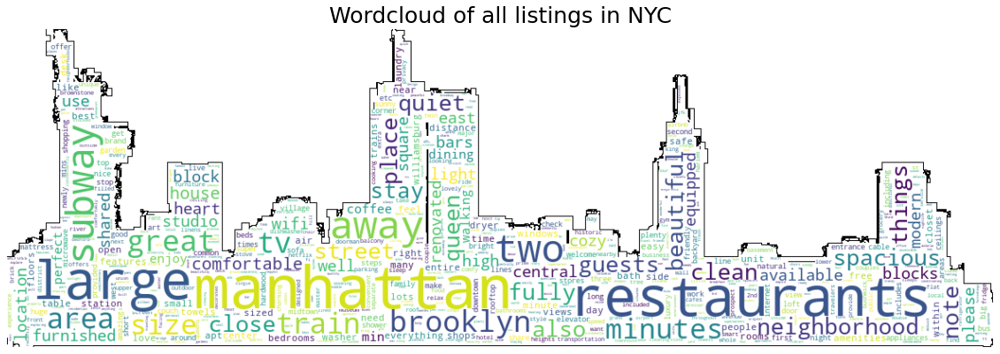

In [51]:
nyc_mask = np.array(Image.open("nyc_skyline.png"))
wc_airbnb_all = generate_word_cloud(stop_words,descriptions,nyc_mask)
plot_word_cloud(wc_airbnb_all,'Wordcloud of all listings in NYC')

### Bar plots based on words used in the description of the listing

We plot a bar chart showing in how many listings some specific words appear, per neighborhood and per borough

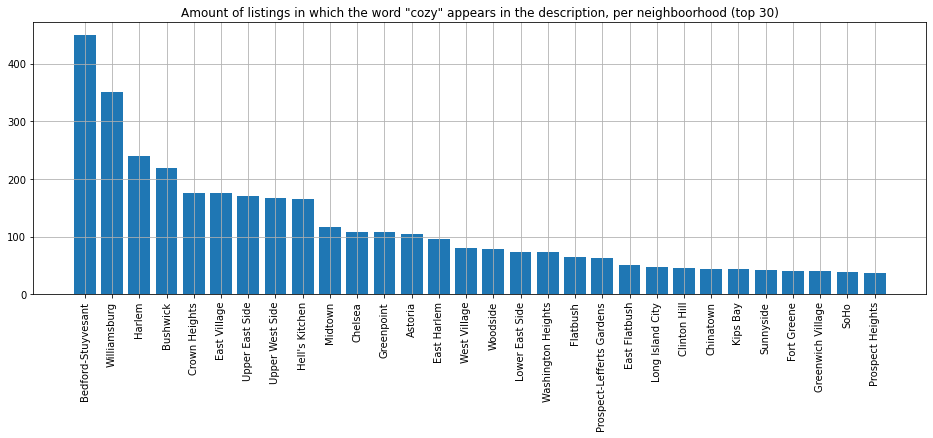

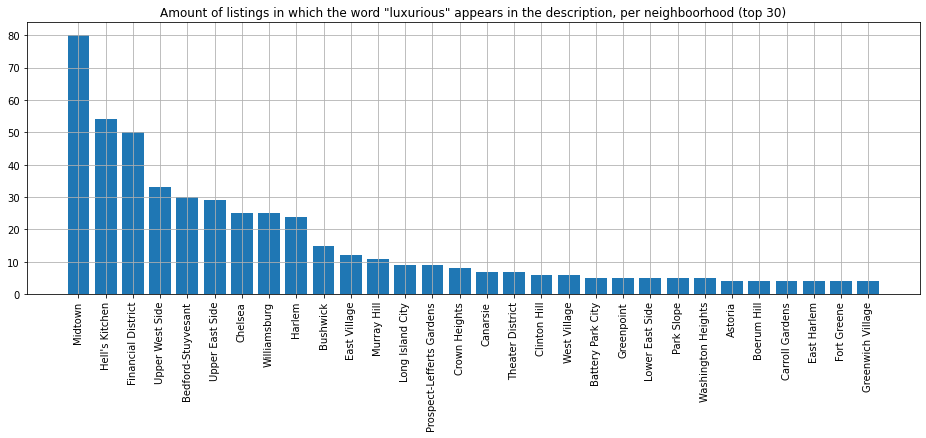

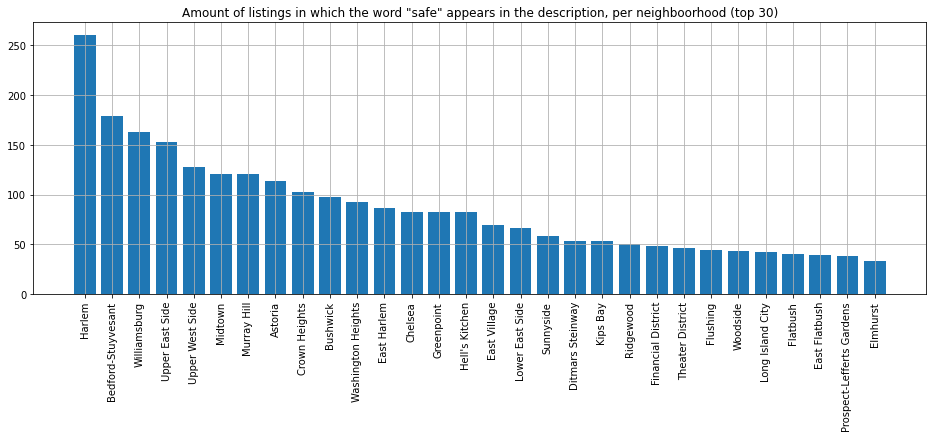

In [52]:
n_plot = 30
#create a dictionary of dataframes for later plotting
df_words_neigh = {}

for word in ['cozy','luxurious','safe']:
    df_words = df.loc[:,['neighbourhood_cleansed','description','price']][df['description'].str.find(word) != -1]\
                    .groupby('neighbourhood_cleansed').agg({'description':['count'],'price':'mean'})
    df_words['listings_count'] = df_words['description']['count']
    df_words['mean_price'] = df_words['price']['mean']
    df_words.drop(axis=1,columns=['description','price'],inplace = True)
    
    df_words_neigh[word] = df_words

    plt.bar(df_words.nlargest(n_plot,'listings_count').index,
            df_words.nlargest(n_plot,'listings_count')['listings_count'].sort_values(ascending=False).values)
    plt.rcParams['figure.figsize']=(16,5)
    plt.xticks(rotation='vertical')
    plt.grid()
    plt.title('Amount of listings in which the word "' + word + '" appears in the description, per neighboorhood (top ' + str(n_plot) + ')')
    plt.show()



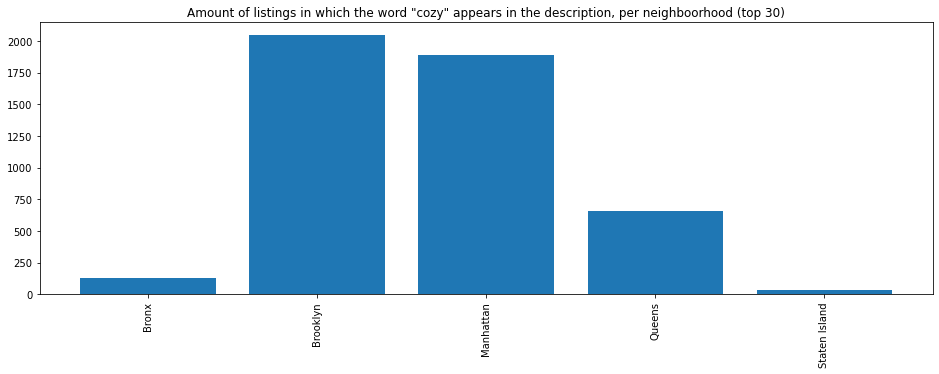

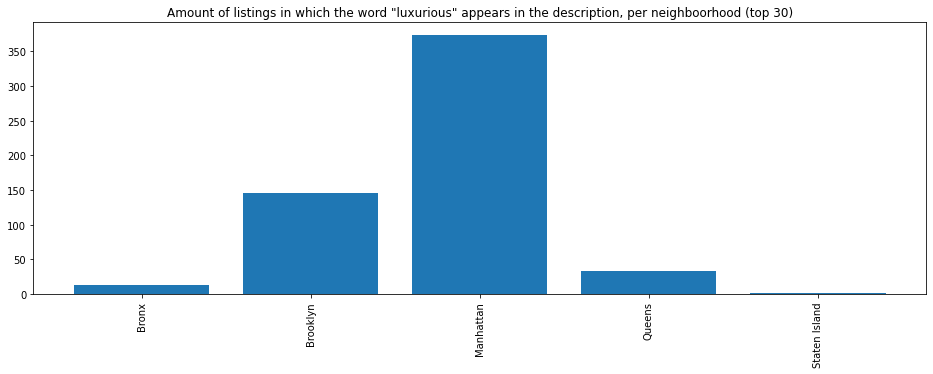

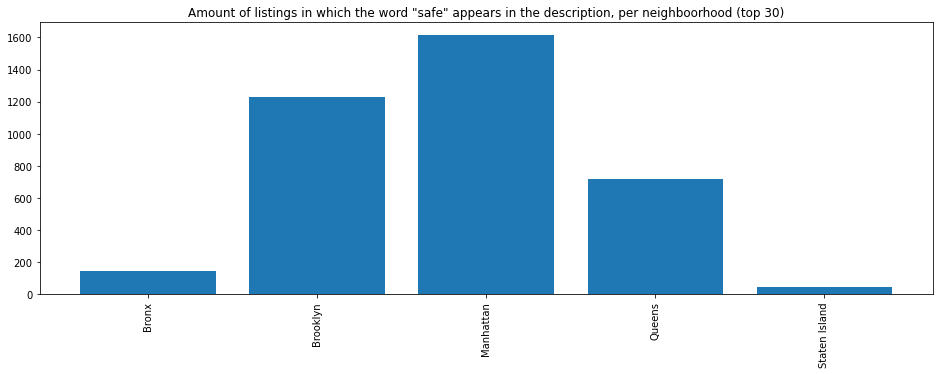

In [53]:
for word in ['cozy','luxurious','safe']:
    df_words_bor = df.loc[:,['neighbourhood_group_cleansed','description','price']][df['description'].str.find(word) != -1]\
                    .groupby('neighbourhood_group_cleansed').agg({'description':['count'],'price':'mean'})
    df_words_bor['listings_count'] = df_words_bor['description']['count']
    df_words_bor['mean_price'] = df_words_bor['price']['mean']
    df_words_bor.drop(axis=1,columns=['description','price'],inplace = True)

    plt.bar(df_words_bor.index, df_words_bor['listings_count'])
    plt.rcParams['figure.figsize']=(16,5)
    plt.xticks(rotation='vertical')
    plt.title('Amount of listings in which the word "' + word + '" appears in the description, per neighboorhood (top ' + str(n_plot) + ')')
    plt.show()


From the above bar plots, we notice that most of the "cozy" listings are distributed across Brooklyn and Manhattan, while in the other boroughs this word does not appear so often. 

It also clear that the "luxurious" listings are mostly in Manhattan (as one would expect), and the second borough with most of the luxurious listings has less than half of Manhattan's luxurious listings. Midtown, Hell's kitchen, and the Financial District are definitely the neighborhoods with the highest amount of luxurious listings.

Manhattan also dominates when it comes to the word "safe". If this word is mentioned more often, this could mean that people do not perceive that particular neighborhood/borough as safe, otherwise there would be no need to mention it. However, it could also be that hosts mention it to make the guests feel "safe", especially given that many tourists might not know the difference between all the neighborhoods. Whatever the reason why the word "safe" appears in the description is, Harlem is definitely the neighborhood where this word appears more often.

It has to be noted that most of the listings are in Manhattan, so an analysis on the frequency and not only the absolute amount of listings should be carried out.

## Plot information on choropleth maps

### Choropleth maps of the listings

Before proceeding with the plots, let's create a function to plot the choropleth maps

In [275]:
def plot_choropleth_map(latitude, longitude, data = None, columns = None, geo_data = None, key_on = None,
                        zoom_start = 10, fill_color = 'RdPu', fill_opacity=0.7, line_opacity=0.8, legend_name = ''):
    chor_map = folium.Map(location=[latitude,longitude],zoom_start=zoom_start)
    if geo_data != None:
        chor_map.choropleth(geo_data = geo_data,
                      data = data,
                      columns = columns,
                      fill_color = fill_color,
                      key_on = key_on,
                      fill_opacity = fill_opacity, 
                      line_opacity = line_opacity,
                      legend_name = legend_name
                     )

    return chor_map

#### Choropleth map of the average price per neighborhood

In [276]:
neighb_prices = df.loc[:,['price','neighbourhood_cleansed']].groupby('neighbourhood_cleansed',as_index=False).mean()

In [277]:
plot_choropleth_map(latitude= df.latitude.mean(),longitude=df.longitude.mean(),data=neighb_prices,
                  geo_data='map/neighbourhoods_nyc.geojson', columns=['neighbourhood_cleansed','price'],
                  fill_color='RdPu', key_on='feature.properties.neighbourhood',
                  legend_name='Average price')

From the choropleth map it is difficult to distinguish the differences between neighborhoods due to a single neighborhood having a much larger average price than the rest. Let's find it and see if it is worth it to keep it in the map

In [278]:
neighb_prices[neighb_prices.price == neighb_prices.price.max()]

,neighbourhood_cleansed,price
81,Fort Wadsworth,800.0


In [279]:
neighb_prices

,neighbourhood_cleansed,price
0,Allerton,98.393939
1,Arden Heights,173.666667
2,Arrochar,107.937500
3,Arverne,205.043478
4,Astoria,87.792366
...,...,...
215,Willowbrook,309.000000
216,Windsor Terrace,125.447917
217,Woodhaven,72.219178
218,Woodlawn,108.250000


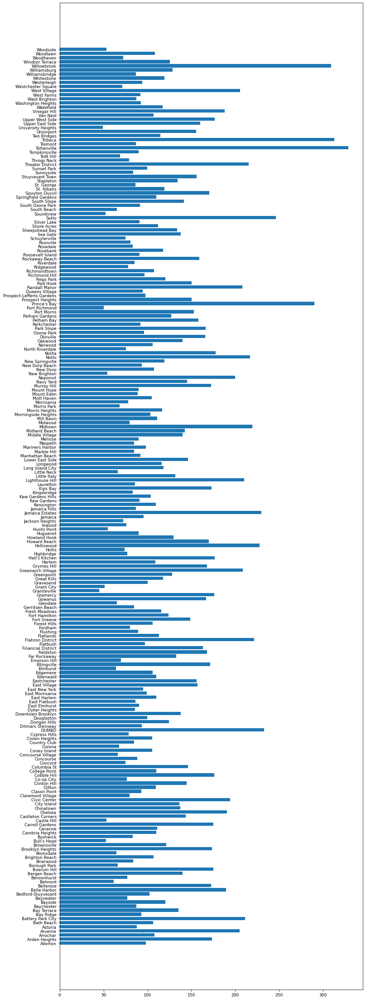

In [285]:
plt.barh(neighb_prices['neighbourhood_cleansed'],neighb_prices['price'])
plt.rcParams['figure.figsize']=(12,40)
plt.tick_params(labelsize=9)
plt.show()

In [281]:
df.neighbourhood_cleansed[df.neighbourhood_cleansed == 'Fort Wadsworth'].count()

1

We find that "Fort Wadsworth" is the neighborhood that contains the maximum price and from the bar plot we see that its value is much higher than the rest. We also notice that there is only one listing in that neighborhood. So it might make more sense to drop this value from the dataframe. We will do so and then replot the map

In [282]:
neighb_prices = neighb_prices[neighb_prices.neighbourhood_cleansed != 'Fort Wadsworth']

In [283]:
plot_choropleth_map(latitude= df.latitude.mean(),longitude=df.longitude.mean(),data=neighb_prices,
                  geo_data='map/neighbourhoods_nyc.geojson', columns=['neighbourhood_cleansed','price'],
                  fill_color='RdPu', key_on='feature.properties.neighbourhood',
                  legend_name='Average price')

From the map, we confirm something we already knew: in general, the average price in Manhattan is higher than for the other boroughs. It seems that the lower west side of Manhattan is more expensive than the rest of the borough, with Tribeca being the most expensive neighborhood in Manhattan.

We also notice that some neighborhoods in Staten Island seem to be among the most expensive ones. Once again, these could be outliers, or single listings as it was the case for the "Fort Wadsworth" neighboorhood. Let's check that

In [58]:
staten_island_counts = df[df.neighbourhood_group_cleansed == 'Staten Island'].groupby('neighbourhood_cleansed').count()['price']
staten_island_counts

neighbourhood_cleansed
Arden Heights         3
Arrochar             16
Bull's Head           2
Castleton Corners     5
Clifton               9
Concord              17
Dongan Hills          3
Eltingville           3
Emerson Hill          5
Fort Wadsworth        1
Graniteville          1
Grant City           11
Great Kills           4
Grymes Hill           6
Howland Hook          3
Huguenot              3
Lighthouse Hill       1
Mariners Harbor      11
Midland Beach         6
New Brighton          6
New Dorp              2
New Dorp Beach        3
New Springville       4
Oakwood               4
Port Richmond         7
Prince's Bay          3
Randall Manor        11
Richmondtown          3
Rosebank              3
Rossville             2
Shore Acres          10
Silver Lake           3
South Beach           2
St. George           41
Stapleton            14
Todt Hill             1
Tompkinsville        40
Tottenville           1
West Brighton        20
Westerleigh           1
Willowbrook      

In [59]:
staten_island_onelisting = staten_island_counts[staten_island_counts == 1]
staten_island_onelisting = staten_island_onelisting[staten_island_onelisting.index != 'Fort Wadsworth']
tmp = neighb_prices.set_index('neighbourhood_cleansed')
tmp.loc[staten_island_onelisting.index]

,price
neighbourhood_cleansed,
Graniteville,45.0
Lighthouse Hill,210.0
Todt Hill,69.0
Tottenville,329.0
Westerleigh,94.0
Willowbrook,309.0


In [60]:
neighb_prices[neighb_prices.neighbourhood_cleansed == 'Tribeca']

,neighbourhood_cleansed,price
197,Tribeca,312.918239


We indeed confirm that for some neighborhoods of Staten Island there is only one listing and the average price is high. However, this does not 'bother' us with respect to the choropleth map, because these high prices are similar to the highest price in Tribeca (shown in the previous cell)

#### Choropleth map of the total amount of listings per neighborhood

Let us now plot another choropleth map, but this time based on the amount of listings per neighborhood. This will complement the information we found about Staten Island in the previous section

In [61]:
neighb_listings = df.loc[:,['price','neighbourhood_cleansed']].groupby('neighbourhood_cleansed',as_index=False).count()
neighb_listings.rename(columns={'price': 'amount'},inplace = True)

In [62]:
plot_choropleth_map(latitude= df.latitude.mean(),longitude=df.longitude.mean(),data=neighb_listings,
                  geo_data='map/neighbourhoods_nyc.geojson', columns=['neighbourhood_cleansed','amount'],
                  fill_color='RdPu', key_on='feature.properties.neighbourhood',
                  legend_name='Amount of listings')

Except for few darker neighborhoods, the rest of the map looks quite uniform. Let's accentuate the difference by using a logarithmic value instead

In [63]:
neighb_listings.loc[:,'amount_log'] = neighb_listings.amount.apply(np.log10)


# Get the maximum value to cap displayed values
max_log = neighb_listings['amount_log'].max()
max_val = int(max_log) + 1

# Prepare the range of the colorbar
values = [i for i in range(max_val)]
ticks = [10**i for i in values]

In [64]:
plot_choropleth_map(latitude= df.latitude.mean(),longitude=df.longitude.mean(),data=neighb_listings,
                  geo_data='map/neighbourhoods_nyc.geojson', columns=['neighbourhood_cleansed','amount_log'],
                  fill_color='RdPu', key_on='feature.properties.neighbourhood',
                  legend_name='Amount of listings (log)')

The legend in the above plot is now in log10 scale and we can appreciate the differences much more.

We can confirm indeed that Staten Island is the borough with the lowest amount of listings, especially on the west side of the island, which is farther from the Ferry and hence from touristic attractions of Manhattan. We also notice that the neighborhoods with more listings are in Manhattan, Brooklyn, and Queens. Between these three boroughs, it is actually Manhattan and Brooklyn that have the neighborhood with more listings.

#### Choropleth map of amount of listings with a specific word in the description per neighborhood

We will now plot a choropleth map that shows, for each neighborhood, how many listings have in the description a specific word. We will use the dictionary of dataframes that we prepared above in the section about the description.

We will show two specific words: "cozy" and "luxurious" and we will see in which neighborhoods owners of Airbnb houses mention more these words.

In [65]:
df_words_neigh['cozy']['neighbourhood_cleansed'] = df_words_neigh['cozy'].index

plot_choropleth_map(latitude= df.latitude.mean(),longitude=df.longitude.mean(),data=df_words_neigh['cozy'],
                  geo_data='map/neighbourhoods_nyc.geojson', columns=['neighbourhood_cleansed','listings_count'],
                  fill_color='RdPu', key_on='feature.properties.neighbourhood',
                  legend_name='Amount of listings')

In [66]:
df_words_neigh['luxurious']['neighbourhood_cleansed'] = df_words_neigh['luxurious'].index

plot_choropleth_map(latitude= df.latitude.mean(),longitude=df.longitude.mean(),data=df_words_neigh['luxurious'],
                  geo_data='map/neighbourhoods_nyc.geojson', columns=['neighbourhood_cleansed','listings_count'],
                  fill_color='RdPu', key_on='feature.properties.neighbourhood',
                  legend_name='Amount of listings')

## Find correlation between features and price

What we do in this section is useful for the next part of the project. Let us start by checking the distribution of the prices

#### Price skewness

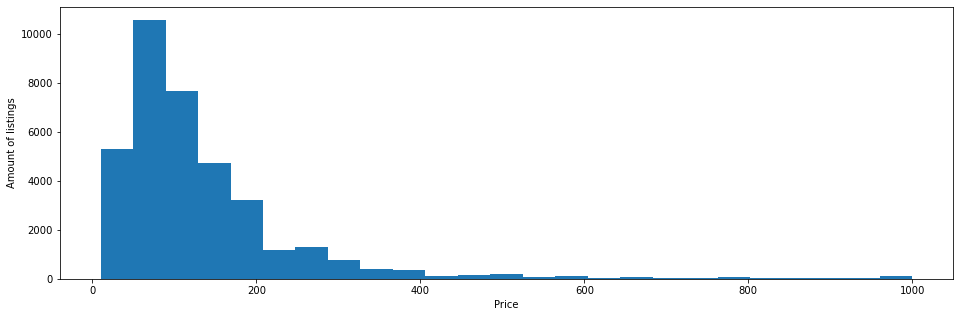

In [289]:
plt.hist(df['price'],bins=25)
plt.xlabel('Price')
plt.ylabel('Amount of listings')
plt.show()

We notice that prices are quite skewed towards the low values. Let's confirm that 

In [293]:
df['price'].skew()

3.314447482144784

We use here the standard practice of log-transforming the price using the numpy function `log1p`. In this way, the price distribution will resemble more a normal distribution

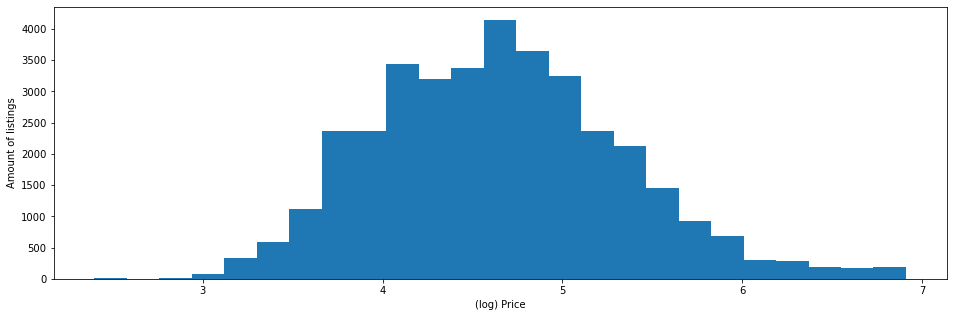

In [294]:
plt.hist(np.log1p(df['price']),bins=25)
plt.xlabel('(log) Price')
plt.ylabel('Amount of listings')
plt.show()

In [295]:
np.log1p(df['price']).skew()

0.39457343723301413

We can notice both from the plot and the above number that the price is much less skewed now and it resembles a normal distribution. We will use the transformed price from here onwards.

#### Correlation of variables with the price

Let's now look at which columns have the highest correlation with the price. In order to see the correlation of the price w.r.t. the categorical variables, let's use the pandas method 'get_dummies' to obtain numerical columns out of the categorical ones (e.g. neighborhood)

In [187]:
df2 = pd.get_dummies(df['neighbourhood_group_cleansed'])

In [188]:
df[df2.columns] = df2

In [189]:
df.head(3)

,listing_url,name,description,host_id,host_since,host_location,host_is_superhost,host_neighbourhood,host_listings_count,host_total_listings_count,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,amenities,price,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,tv,heating,fire extinguisher,elevator,parking,carbon monoxide alarm,first aid kit,washer,microwave,bathtub,stove,iron,dedicated workspace,hangers,wifi,lockbox,coffee maker,dishes and silverware,dryer,lock on bedroom door,cooking basics,host greets you,gym,luggage dropoff allowed,shampoo,private entrance,kitchen,refrigerator,hot water,long term stays allowed,essentials,security cameras on property,air conditioning,smoke alarm,oven,pillows,bedlinens,Entire home/apt,Hotel room,Private room,Shared room,Barn,Boat,Bus,Camper/RV,Cave,Entire apartment,Entire bed and breakfast,Entire bungalow,Entire condominium,Entire cottage,Entire floor,Entire guest suite,Entire guesthouse,Entire house,Entire loft,Entire place,Entire resort,Entire serviced apartment,Entire townhouse,Entire villa,Houseboat,Lighthouse,Private room in apartment,Private room in barn,Private room in bed and breakfast,Private room in bungalow,Private room in cabin,Private room in camper/rv,Private room in casa particular,Private room in castle,Private room in condominium,Private room in cottage,Private room in dome house,Private room in dorm,Private room in earth house,Private room in farm stay,Private room in floor,Private room in guest suite,Private room in guesthouse,Private room in hostel,Private room in house,Private room in in-law,Private room in lighthouse,Private room in loft,Private room in resort,Private room in serviced apartment,Private room in tent,Private room in tiny house,Private room in tipi,Private room in townhouse,Private room in train,Private room in villa,Room in aparthotel,Room in bed and breakfast,Room in boutique hotel,Room in hotel,Room in resort,Room in serviced apartment,Shared room in apartment,Shared room in bed and breakfast,Shared room in bungalow,Shared room in condominium,Shared room in earth house,Shared room in floor,Shared room in guest suite,Shared room in guesthouse,Shared room in hostel,Shared room in house,Shared room in loft,Shared room in serviced apartment,Shared room in tent,Shared room in townhouse,Tiny house,Windmill,Allerton,Arden Heights,Arrochar,Arverne,Astoria,Bath Beach,Battery Park City,Bay Ridge,Bay Terrace,Baychester,Bayside,Bayswater,Bedford-Stuyvesant,Belle Harbor,Bellerose,Belmont,Bensonhurst,Bergen Beach,Boerum Hill,Borough Park,Briarwood,Brighton Beach,Bronxdale,Brooklyn Heights,Brownsville,Bull's Head,Bushwick,Cambria Heights,Canarsie,Carroll Gardens,Castle Hill,Castleton Corners,Chelsea,Chinatown,City Island,Civic Center,Claremont Village,Clason Point,Clifton,Clinton Hill,Co-op City,Cobble Hill,College Point,Columbia St,Concord,Concourse,Concourse Village,Coney Island,Corona,Country Club,Crown Heights,Cypress Hills,DUMBO,Ditmars Steinway,Dongan Hills,Douglaston,Downtown Brooklyn,Dyker Heights,East Elmhurst,East Flatbush,East Harlem,East Morrisania,East New York,East Village,Eastchester,Edenwald,Edgemere,Elmhurst,Eltingville,Emerson Hill,Far Rockaway,Fieldston,Financial District,Flatbush,Flatiron District,Flatlands,Flushing,Fordham,Forest Hills,Fort Greene,Fort Hamilton,Fort Wadsworth,Fresh Meadows,Gerritsen Beach,Glendale,Gowanus,Gramercy,Graniteville,Grant City,Gravesend,Great Kills,Greenpoint,Greenwich Village,Grymes Hill,Harlem,Hell's Kitchen,Highbridge,Hollis,Holliswood,Howard Beach,Howland Hook,Huguenot,Hunts Point,Inwood,Jackson Heights,Jamaica,Jamaica Estates,Jamaica Hills,Kensington,Kew Gardens,Kew Gardens Hills,Kingsbridge,Kips Bay,Laurelton,Lighthouse Hill,Littl

In [255]:
df_corr_price = df.corr()['price'].sort_values()
print(df_corr_price)

Private room in apartment   -0.329994
lock on bedroom door        -0.260304
longitude                   -0.204649
Queens                      -0.133324
Private room in house       -0.123454
                               ...   
beds                         0.368770
bedrooms                     0.426349
accommodates                 0.486689
price                        1.000000
bedlinens                         NaN
Name: price, Length: 362, dtype: float64


In [213]:
pearson_coef, p_value = stats.pearsonr(df['price'], df['review_scores_cleanliness'])
print(pearson_coef, p_value)

0.059509515885096786 4.1589382419342006e-30


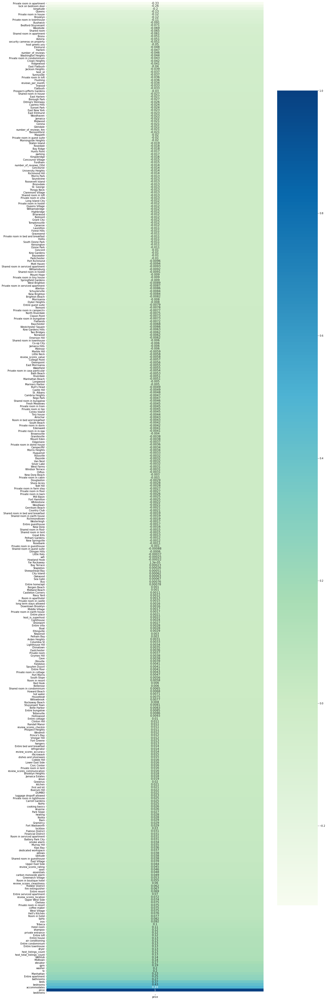

In [242]:
fig, ax = plt.subplots(figsize=(20,75))

sns.heatmap(df_corr_price.to_frame(),annot=True, annot_kws={'size':12},cmap="GnBu")


Text(0, 0.5, 'price')

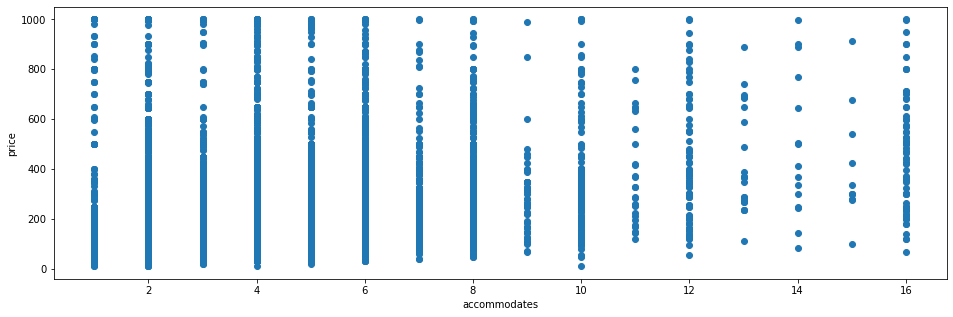

In [256]:
xvar = 'accommodates'
yvar = 'price'
plt.scatter(df[xvar], (df[yvar]))
plt.xlabel(xvar)
plt.ylabel(yvar)

In [230]:
np.shape(df[df.price == 0].index)

(35,)

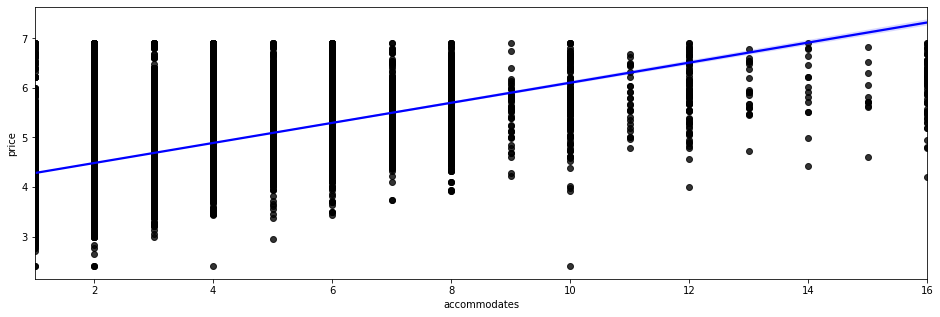

In [257]:
xvar = 'accommodates'
yvar = 'price'
sns.regplot(df[xvar],np.log1p(df[yvar]), logistic= False, scatter_kws={"color": "black"}, line_kws={"color": "blue"})

### Feature engineering

Let's create some new variables based on the available information that we have. Then, we will compute the correlation between these new variables and the (log-transformed) price, and keep the ones that have the highest correlation

#### Amenities features

Some of the amenities in the properties, e.g. wifi, appear in many listings, others are more rare. We would like therefore to introduce some variables that assign a higher importance to amenities that appear more often and a lower value to more rare amenities. Then, we can compute a weighted average of all the amenities to obtain a single value, with which we will check the correlation with the price.

Luckily, we have already computed how many times a specific amenity appears in the listings. The values are stored in `amenities_kept`. Let's divide it by `len(df.index)` and obtain the frequency of the amenities

In [310]:
amenities_freq = amenities_kept/len(df.index)

Let's now compute the score for each listing. This is done as $$\sum_{i\in\mathrm{amenities}} \delta_i f^{\mathrm{amenity}}_{i},$$
where $\delta_i = 1$ if the amenity $i$ is present in a specific listing ($0$ otherwise) and  $f^{\mathrm{amenity}}_{i}$ is the frequency of the amenity, previously computed and stored in `amenities_freq`.

After computing the values, let's also compute the correlation and plot a scatter plot

In [349]:
def amenity_score(df,amenities_freq,amenities_kept):
    return sum(df[amenities_kept.keys()]*amenities_freq)/sum(amenities_freq.values)


df['amenity_score_weighted'] = df.apply(lambda row: amenity_score(row[amenities_kept.keys()], amenities_freq,amenities_kept),
                               axis=1)
df.amenity_score_weighted

2595        0.831039
3831        0.895955
5121        0.255373
5136        0.452123
5178        0.553078
              ...   
49088566    0.683866
49089512    0.631406
49089765    0.702518
49091581    0.618371
49092532    0.753541
Name: amenity_score_weighted, Length: 36603, dtype: float64

In [350]:
pearson_coef, p_value = stats.pearsonr(np.log1p(df['price']), df['amenity_score_weighted'])
print(pearson_coef, p_value)

0.17229674652431992 7.424120847559895e-242


Text(0, 0.5, '(log) price')

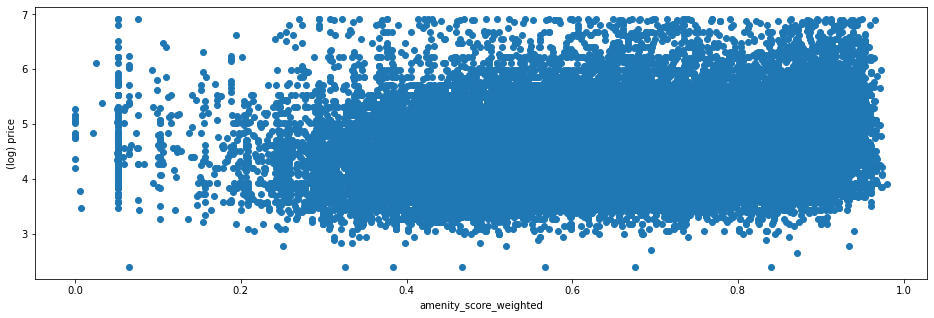

In [360]:
xvar = 'amenity_score_weighted'
yvar = 'price'
plt.scatter(df[xvar], np.log1p(df[yvar]))
plt.xlabel(xvar)
plt.ylabel('(log) price')

The correlation is quite low. Let's try another score, by simply assigning a value to the listing equal to all the amenities present in that listing

In [346]:
df['amenity_score_sum'] = df[amenities_kept.keys()].sum(axis=1)

In [347]:
pearson_coef, p_value = stats.pearsonr(np.log1p(df['price']), df['amenity_score_sum'])
print(pearson_coef, p_value)

0.14981539988379478 1.061665347238497e-182


Text(0, 0.5, '(log) price')

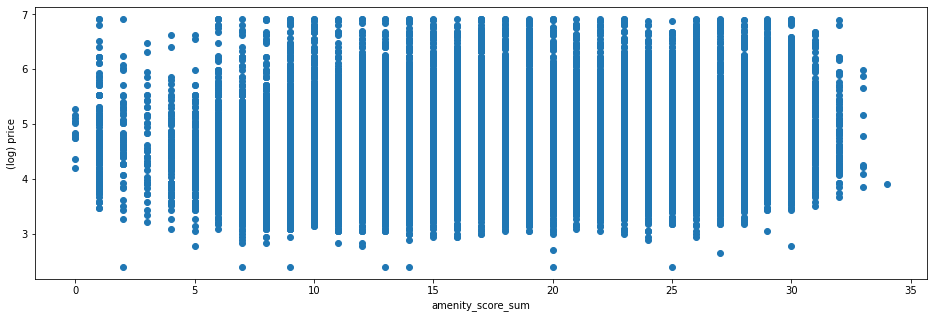

In [361]:
xvar = 'amenity_score_sum'
yvar = 'price'
plt.scatter(df[xvar], np.log1p(df[yvar]))
plt.xlabel(xvar)
plt.ylabel('(log) price')

Counting all the amenities yielded even worse performance. This, however, was somehow expected, as there was less information present in that variable.

Let us now try a different approach. Let us focus only on the frequency of the amenities

In [366]:
amenities_freq_1to0 = amenities_freq/amenities_freq.max()

In [367]:
df['amenity_score_weighted_new'] = df.apply(lambda row: amenity_score(row[amenities_kept.keys()], amenities_freq_1to0,amenities_kept),
                               axis=1)
df.amenity_score_weighted_new

2595        0.831039
3831        0.895955
5121        0.255373
5136        0.452123
5178        0.553078
              ...   
49088566    0.683866
49089512    0.631406
49089765    0.702518
49091581    0.618371
49092532    0.753541
Name: amenity_score_weighted_new, Length: 36603, dtype: float64

#### Location of the listing

We have seen before that there is a fair correlation (~0.20) between the price and the longitude. Let's see if we can create a new variable that has a higher correlation with the price. One idea could be measuring the distance from the Empire State Building. This is because this landmark is in Midtown Manhattan and the closest the listing is, the higher its price should be.Think of all the tourists that would love to be in such a central location...

In [398]:
#Let's create two variables with the coordinates of the Empire State Building (ESB)
ESB_long = -73.985664
ESB_lat = 40.748441

In [399]:
df['distance_from_ESB'] = (np.sqrt((df.latitude-ESB_lat)**2 + (df.longitude-ESB_long)**2))

In [403]:
df['distance_from_ESB'] - df['distance_from_ESB'].max()

2595       -0.259883
3831       -0.249019
5121       -0.246942
5136       -0.256228
5178       -0.249066
              ...   
49088566   -0.207894
49089512   -0.214209
49089765   -0.277304
49091581   -0.250198
49092532   -0.247351
Name: distance_from_ESB, Length: 36603, dtype: float64

In [400]:
pearson_coef, p_value = stats.pearsonr(np.log1p(df['price']), df['distance_from_ESB'])
print(pearson_coef, p_value)

-0.28995446745781855 0.0


Nice! So we have found a feature that has a higher correlation with respect to the sole longitude or latitude. Actually, this feature has a correlation that is close to the highest correlation we found, i.e. ~0.486, so we will keep it and include it in our model.

Let's go one step further and build a new variable that takes into account the distance from the top NYC touristic attractions, rather than from just the ESB

## Export the final dataframe for model creation

Lastly, we export the dataframe removing all the columns we don't need for the second part of this project, where we will create machine learning models to predict the price of the listings given its features

In [140]:
#Check which columns to drop in the df
df.columns

Index(['listing_url', 'name', 'description', 'host_id', 'host_since',
       'host_location', 'host_is_superhost', 'host_neighbourhood',
       'host_listings_count', 'host_total_listings_count',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bedrooms', 'beds', 'amenities', 'price', 'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'reviews_per_month', 'dryer',
       'carbon monoxide alarm', 'air conditioning', 'dedicated workspace',
       'cooking basics', 'lockbox', 'heating', 'oven', 'hangers', 'tv',
       'host greets you', 'iron', 'luggage dropoff allowed', 'smoke alarm',
       'long term stays allowed', 'elev

In [143]:
df.drop(columns=['listing_url', 'name', 'description', 'host_id', 'host_since','host_location',
                 'host_neighbourhood','number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review'], inplace=True)

In [144]:
df.to_csv('listings_NYC_models_ready.csv')

In [650]:
## instantiate a feature group for the incidents in the dataframe
#maplistings = folium.map.FeatureGroup()
#
## loop through the 100 crimes and add each to the incidents feature group
#for lat, lng, in zip(df.latitude, df.longitude):
#    maplistings.add_child(
#        folium.features.CircleMarker(
#            [lat, lng],
#            radius=2, # define how big you want the circle markers to be
#            color='red',
#            fill=True,
#            fill_color='blue',
#            fill_opacity=0.6
#        )
#    )
#
## add incidents to map
#nycmap.add_child(maplistings)